# Advanced Approach for Trace Clustering - Exploration

The basic approach for trace clustering was fast to compute. It gave us some first idea what to expect from the event log. However, the basic approach was limited to the simple features extracted from the event log. 

In this notebook, we will explore more advanced approaches for trace clustering using graph embeddings instead of one-hot-encoding for feature extraction and alternative clustering algorithms instead of kMeans.

**Exploration Goal:** Could advanced approaches provide us with more insights and better results than the basic approach?


> **Update:** After exploration of many different options for graph embeddings and clustering no final conclusion on the advantage compared to the basic approach can be made. Some trade-offs between complexity, performance and runtime could be observed. More in-depth experiments with the one selected approach needed. -> see `2_tuning-advanced-approach.ipynb`


## Imports

In [1]:
%reload_ext autoreload
%autoreload 2
import warnings
warnings.filterwarnings('ignore')
from IPython.utils import io

import pandas as pd
import pm4py
from pm4py.algo.discovery.heuristics import algorithm as heuristics_miner
from pm4py.objects.conversion.log import converter as log_converter
import numpy as np
from scipy.cluster.hierarchy import dendrogram
from karateclub.node_embedding.neighbourhood import Node2Vec, Walklets
from karateclub.node_embedding import GraphWave
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from umap import UMAP
from minisom import MiniSom
from clustpy.deep import DEC, IDEC
from practical.ProcessMining.group1.shared import utils
from practical.ProcessMining.group1.shared.visualizer import Visualizer
from practical.ProcessMining.group1.task4.tokenreplay import TokenReplay

visualizer = Visualizer()
LOG_PATH = "../shared/example_files/DomesticDeclarations.xes"   
experiment_results = {}

## Helper Functions
Various code snippets to try to declutter the notebook results below. 

### Data Preparation
Networkx and PM4PY are used to create a graph.

In [2]:
def get_traces_from_log(log):
    ids = list(log["case:concept:name"].unique())
    traces = [["".join(x) for x in list(log[log["case:concept:name"] == case_id]["concept:name"])] for case_id in ids]
    return ids, traces

def create_graph(log):
    graph = nx.Graph()
    dfg = pm4py.discover_dfg(log)
    for edge in dfg[0].items():
        graph.add_weighted_edges_from([(edge[0][0], edge[0][1], edge[1])])
    for node in dfg[1].items():
        if node not in graph.nodes():
            graph.add_node(node[0], start=True)
    for node in dfg[2].items():
        if node not in graph.nodes():
            graph.add_node(node[0], end=True)
    return graph

def apply_mapping(graph, traces):
    mapping = dict(zip(graph.nodes(), [i for i in range(len(graph.nodes()))]))
    graph = nx.relabel_nodes(graph, mapping)
    mapped_traces = [[mapping[a] for a in trace] for trace in traces]
    return graph, mapped_traces

### Graph Embeddings
Encodings are obtained via the karateclub implementation of the graph encoding algorithms.

In [3]:
def generate_node2vec_node_embeddings(graph, mapped_traces):
    model = Node2Vec()
    model.fit(graph)
    embeddings = model.get_embedding()
    vectors = []
    for trace in mapped_traces:
        trace_vector = []
        for token in trace:
            trace_vector.append(embeddings[token])
        if len(trace_vector) == 0:
            trace_vector.append(np.zeros(128))
        vectors.append(np.array(trace_vector).mean(axis=0))
    return vectors

def generate_node2vec_edge_embeddings(graph, mapped_traces):
    model = Node2Vec()
    model.fit(graph)
    embeddings = model.get_embedding()
    vectors = []
    for trace in mapped_traces:
        trace_vector = []
        for i in range(len(trace)-1):
            emb1, emb2 = embeddings[trace[i]], embeddings[trace[i+1]]
            trace_vector.append((emb1 + emb2)/2.0)
        if len(trace_vector) == 0:
            trace_vector.append(np.zeros(128))
        vectors.append(np.array(trace_vector).mean(axis=0))
    return vectors

def generate_graphwave_embeddings(graph, mapped_traces):
    model = GraphWave()
    model.fit(graph)
    embeddings = model.get_embedding()
    vectors = []
    for trace in mapped_traces:
        trace_vector = []
        for token in trace:
            trace_vector.append(embeddings[token])
        vectors.append(np.array(trace_vector).mean(axis=0))
    return vectors

def generate_walklets_node_embeddings(graph, mapped_traces):
    model = Walklets()
    model.fit(graph)
    embeddings = model.get_embedding()
    vectors = []
    for trace in mapped_traces:
        trace_vector = []
        for token in trace:
            trace_vector.append(embeddings[token])
        if len(trace_vector) == 0:
            trace_vector.append(np.zeros(32))
        vectors.append(np.array(trace_vector).mean(axis=0))
    return vectors

def generate_walklets_edge_embeddings(graph, mapped_traces):
    model = Walklets()
    model.fit(graph)
    embeddings = model.get_embedding()
    vectors = []
    for trace in mapped_traces:
        trace_vector = []
        for i in range(len(trace)-1):
            emb1, emb2 = embeddings[trace[i]], embeddings[trace[i+1]]
            trace_vector.append((emb1 + emb2)/2.0)
        if len(trace_vector) == 0:
            trace_vector.append(np.zeros(128))
        vectors.append(np.array(trace_vector).mean(axis=0))
    return vectors

def get_encoding_df(vectors, ids):
    encoded_df = pd.DataFrame(vectors, columns=[f'{i}' for i in range(len(vectors[0]))])
    encoded_df.insert(0, "case", ids)
    return encoded_df

### Clustering
For clustering scikit-learn, MiniSOM and ClustPy implementations are used.

In [4]:
def cluster_data_kmeans(encoded_df, n_clusters=5, **kwargs):
    X = encoded_df.iloc[:, 1:]
    clusters = KMeans(n_clusters=n_clusters, random_state=42, **kwargs).fit_predict(X)
    return clusters

def cluster_data_gmm(encoded_df, n_clusters=5, **kwargs):
    X = encoded_df.iloc[:, 1:]
    clusters  = GaussianMixture(n_components=n_clusters, random_state=42, **kwargs).fit_predict(X)
    return clusters

def cluster_data_som(encoded_df, n_clusters=5, **kwargs):
    X = encoded_df.iloc[:, 1:]
    som = MiniSom(1, n_clusters, X.shape[1], sigma=0.6, learning_rate=0.5, **kwargs)
    som.train_batch(X.values, 3000)
    clusters = [som.winner(x)[1] for x in X.values]
    return clusters

def cluster_data_hierarchical(encoded_df, n_clusters=5, **kwargs):
    X = encoded_df.iloc[:, 1:]
    clusters = AgglomerativeClustering(n_clusters=n_clusters, **kwargs).fit_predict(X)
    return clusters

def cluster_data_dec(encoded_df, n_clusters=5, **kwargs):
    X = encoded_df.iloc[:, 1:].to_numpy()
    dec = DEC(n_clusters=n_clusters, embedding_size=X.shape[1], **kwargs)
    clusters  = dec.fit_predict(X)
    return clusters

def cluster_data_idec(encoded_df, n_clusters=5, **kwargs):
    X = encoded_df.iloc[:, 1:].to_numpy()
    idec = IDEC(n_clusters=n_clusters, embedding_size=X.shape[1], **kwargs)
    clusters = idec.fit_predict(X)
    return clusters

def add_clusters_to_log(log, encoding, clusters):
    log_with_clusters = log.copy()
    encoding_with_clusters = encoding.copy()
    encoding_with_clusters["cluster"] = clusters
    log_with_clusters["cluster"] = log_with_clusters["case:concept:name"].map(encoding_with_clusters.set_index("case")["cluster"])
    return log_with_clusters

def split_log_by_clusters(log_with_clusters):
    clustered_logs = {}
    for cluster in log_with_clusters["cluster"].unique():
        clustered_logs[cluster] = log_with_clusters[log_with_clusters["cluster"] == cluster]
    return clustered_logs

### Process Mining and Evaluation
Evaluation of the process mining results is done with PM4PY. Visualization of token replay is taken from our own implementation. PCA and UMAP dimensionality reduction is calculated for cluster visualization in 2D space. SciPy helps with composing a dendrogram to show hierarchy of clusters.

In [5]:
def evaluate_model(log, net, im, fm):
    with io.capture_output() as captured:
        fitness = pm4py.conformance.fitness_alignments(log, net, im, fm)
        precision = pm4py.conformance.precision_alignments(log, net, im, fm)
        generalization = pm4py.algo.evaluation.generalization.algorithm.apply(log, net, im, fm)
        simplicity = pm4py.algo.evaluation.simplicity.algorithm.apply(net)
    
    return { "fitness": fitness['averageFitness'], 
             "precision": precision, 
             "generalization": generalization, 
             "simplicity": simplicity,
             "log_length": log.shape[0]}

def mine_petri_nets(clustered_logs, encoding, clusters, name=""):
    scores = {}
    for cluster, cluster_log in sorted(clustered_logs.items()):
        print(f'=== Cluster {cluster}: {cluster_log.shape[0]} events, {cluster_log["case:concept:name"].unique().shape[0]} cases ===')
        net, im, fm, graph = viz_petri_net(cluster_log)
        visualizer.display(graph)
        scores[cluster] = evaluate_model(cluster_log, net, im, fm)
        scores[cluster]["custom"] = utils.custom_metric(cluster_log, encoding, clusters, net, im, fm)
    
    scores_df = pd.DataFrame(scores).T
    scores_df.index.name = 'Cluster'
    print(f'=== Process Model Scores ===')
    print(scores_df)
    
    log_lengths = scores_df["log_length"]
    weighted_average_scores = scores_df.drop(columns="log_length").multiply(log_lengths, axis=0).sum() / log_lengths.sum()
    experiment_results[name] = weighted_average_scores
    print(f'=== Weighted Average Process Model Scores ===')
    print(weighted_average_scores)
    
    print(f'=== Clustering Scores ===')
    score = silhouette_score(encoding, clusters)
    print(f'Silhouette Score: {score}')
    custom_metric = scores_df["custom"].mean()
    print(f'Custom Metric: {custom_metric}')
    
def viz_petri_net(log):
    net, im, fm = heuristics_miner.apply(log)
    log = log_converter.to_event_log.apply(log)
    with io.capture_output() as captured:
        replay = TokenReplay(log, net, im, fm, "HM")
        replay.run(log)
    tokens = replay.get_unconformity_tokens()
    graph = visualizer.build_petri_net(net, im, fm, tokens)
    return net, im, fm, graph


def plot_dimension_reduction(X, clusters):
    plt.figure(figsize=(10, 5))

    title_fontsize = 16
    legend_fontsize = 14
    
    # PCA
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(X)
    ax1 = plt.subplot(1, 2, 1)
    for cluster in np.unique(clusters):
        ix = np.where(clusters == cluster)
        ax1.scatter(pca_result[ix, 0], pca_result[ix, 1], label=cluster, s=10)
    ax1.set_title('PCA - Clustering Results', fontsize=title_fontsize)
    
    # UMAP
    umap = UMAP(n_components=2)
    umap_result = umap.fit_transform(X)
    ax2 = plt.subplot(1, 2, 2)
    for cluster in np.unique(clusters):
        ix = np.where(clusters == cluster)
        ax2.scatter(umap_result[ix, 0], umap_result[ix, 1], label=cluster, s=10)
    ax2.set_title('UMAP - Clustering Results', fontsize=title_fontsize)
    
    handles, labels = ax1.get_legend_handles_labels()
    plt.figlegend(handles, labels, loc='lower center', ncol=5, labelspacing=0., fontsize=legend_fontsize, bbox_to_anchor=(0.5, -0.1))
    
    plt.show()

def plot_dendrogram(X):
    model = AgglomerativeClustering(distance_threshold=0, n_clusters=None).fit(X)
    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, truncate_mode="lastp", p=5)
    
    plt.title("Hierarchical Clustering Dendrogram")
    plt.xlabel("Number of points in node (or index of point if no parenthesis).")
    plt.show()
    

## Data Exploration and Preprocessing

Before we start with the advanced approach, we need to load the event logs and perform some basic data exploration and preprocessing steps. 
We will load the event logs, print some basic statistics, and visualize the event log in its initial spaghetti model form.

What the BPI challenge tells us about the underlying process: 

_"After submission by the employee, the request is sent for approval to the travel administration. If approved, the request is then forwarded to the budget owner and after that to the supervisor. If the budget owner and supervisor are the same person, then only one of these steps is taken. In some cases, the director also needs to approve the request.The process finished with either the trip taking place or a payment being requested and payed. "_

[BPI Challenge 2020: Domestic Declarations](https://data.4tu.nl/datasets/6a0a26d2-82d0-4018-b1cd-89afb0e8627f)

In [6]:
print(f'Loading {LOG_PATH} ...')
log = utils.import_xes(LOG_PATH)
log

Loading ../shared/example_files/DomesticDeclarations.xes ...


parsing log, completed traces ::   0%|          | 0/10500 [00:00<?, ?it/s]

,id,org:resource,concept:name,time:timestamp,org:role,case:id,case:concept:name,case:BudgetNumber,case:DeclarationNumber,case:Amount
0,st_step 86794_0,STAFF MEMBER,Declaration SUBMITTED by EMPLOYEE,2017-01-09 09:49:50+00:00,EMPLOYEE,declaration 86791,declaration 86791,budget 86566,declaration number 86792,26.851205
1,st_step 86793_0,STAFF MEMBER,Declaration FINAL_APPROVED by SUPERVISOR,2017-01-09 11:27:48+00:00,SUPERVISOR,declaration 86791,declaration 86791,budget 86566,declaration number 86792,26.851205
2,dd_declaration 86791_19,SYSTEM,Request Payment,2017-01-10 09:34:44+00:00,UNDEFINED,declaration 86791,declaration 86791,budget 86566,declaration number 86792,26.851205
3,dd_declaration 86791_20,SYSTEM,Payment Handled,2017-01-12 17:31:22+00:00,UNDEFINED,declaration 86791,declaration 86791,budget 86566,declaration number 86792,26.851205
4,st_step 86798_0,STAFF MEMBER,Declaration SUBMITTED by EMPLOYEE,2017-01-09 10:26:14+00:00,EMPLOYEE,declaration 86795,declaration 86795,budget 86566,declaration number 86796,182.464172
...,...,...,...,...,...,...,...,...,...,...
56432,st_step 138363_0,STAFF MEMBER,Declaration SUBMITTED by EMPLOYEE,2018-12-29 17:50:14+00:00,EMPLOYEE,declaration 138359,declaration 138359,budget 86566,declaration number 138360,190.404576
56433,st_step 138361_0,STAFF MEMBER,Declaration APPROVED by ADMINISTRATION,2018-12-29 17:56:13+00:00,ADMINISTRATION,declaration 138359,declaration 138359,budget 86566,declaration number 138360,190.404576
56434,st_step 138362_0,STAFF MEMBER,Declaration FINAL_APPROVED by SUPERVISOR,2019-01-03 08:55:52+00:00,SUPERVISOR,declaration 138359,declaration 138359,budget 86566,declaration number 138360,190.404576
56435,dd_declaration 138359_19,SYSTEM,Request Payment,2019-01-08 08:20:28+00:00,UNDEFINED,declaration 138359,declaration 138359,budget 86566,declaration number 138360,190.404576


In [7]:
# most frequent activities
log["concept:name"].value_counts()

Declaration SUBMITTED by EMPLOYEE             11531
Declaration FINAL_APPROVED by SUPERVISOR      10131
Payment Handled                               10044
Request Payment                               10040
Declaration APPROVED by ADMINISTRATION         8202
Declaration APPROVED by BUDGET OWNER           2820
Declaration REJECTED by EMPLOYEE               1365
Declaration REJECTED by ADMINISTRATION          952
Declaration APPROVED by PRE_APPROVER            685
Declaration REJECTED by SUPERVISOR              293
Declaration SAVED by EMPLOYEE                   135
Declaration REJECTED by MISSING                  91
Declaration REJECTED by PRE_APPROVER             86
Declaration REJECTED by BUDGET OWNER             59
Declaration FOR_APPROVAL by SUPERVISOR            1
Declaration FOR_APPROVAL by PRE_APPROVER          1
Declaration FOR_APPROVAL by ADMINISTRATION        1
Name: concept:name, dtype: int64

**Insight:** Some events are very uncommen and therefore probably hard to fit into a process model. 

In [8]:
trace_per_case = log.groupby("case:concept:name")["concept:name"].aggregate(lambda x: tuple(x))
# unique traces
print(f'Unique traces: {trace_per_case.unique().shape[0]}')
# most frequent traces
for trace, freq in trace_per_case.value_counts().head().items():
    print(f'{trace} ({freq} occurrences)')
# least frequent traces
for trace, freq in trace_per_case.value_counts().tail().items():
    print(f'{trace} ({freq} occurrences)')

Unique traces: 99
('Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by ADMINISTRATION', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled') (4618 occurrences)
('Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by ADMINISTRATION', 'Declaration APPROVED by BUDGET OWNER', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled') (2473 occurrences)
('Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled') (1392 occurrences)
('Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by PRE_APPROVER', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled') (575 occurrences)
('Declaration SUBMITTED by EMPLOYEE', 'Declaration REJECTED by ADMINISTRATION', 'Declaration REJECTED by EMPLOYEE', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by ADMINISTRATION', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Paym

Average trace length: 5.374952380952381


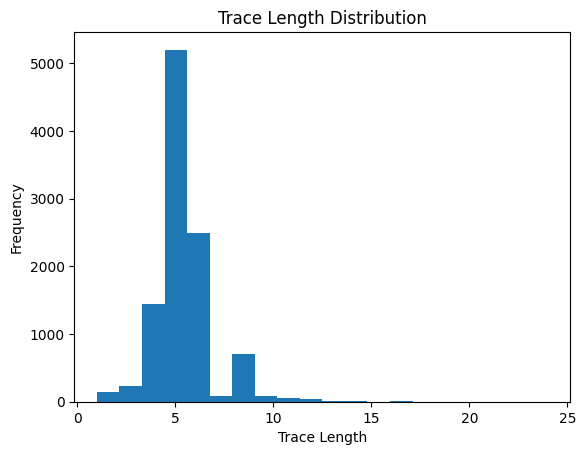

In [9]:
# average trace length
trace_lengths = [len(trace) for trace in trace_per_case]
print(f'Average trace length: {np.mean(trace_lengths)}')
# trace length distribution
plt.hist(trace_lengths, bins=20)
plt.xlabel('Trace Length')
plt.ylabel('Frequency')
plt.title('Trace Length Distribution')
plt.show()

**Insight:** Traces are relatively short. Removing some outliers with length 1 or >10 could be beneficial (done later for tuning).

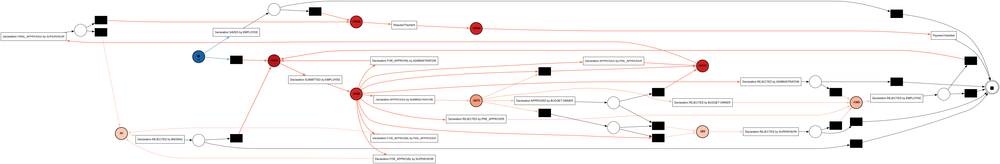

In [10]:
net, im, fm , graph = viz_petri_net(log)
visualizer.display(graph)

**Insight:** Without clustering it is very hard to extract information from this "spaghetti model"

## Graph Encodings

Node2Vec, GraphWave, and Walklets are used to encode the graph structure of the event log.

In [11]:
ids, traces = get_traces_from_log(log)

for id, trace in zip(ids, traces):
    print(f'{id}: {trace}')

declaration 86791: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled']
declaration 86795: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by PRE_APPROVER', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled']
declaration 86800: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by PRE_APPROVER', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled']
declaration 86731: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled']
declaration 86735: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled']
declaration 86805: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled']
declaration 86809: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED b

In [12]:
graph = create_graph(log)
graph, mapped_traces = apply_mapping(graph, traces)

for id, trace in zip(ids, mapped_traces):
    print(f'{id}: {trace}')

declaration 86791: [10, 2, 8, 7]
declaration 86795: [10, 5, 2, 8, 7]
declaration 86800: [10, 5, 2, 8, 7]
declaration 86731: [10, 2, 8, 7]
declaration 86735: [10, 2, 8, 7]
declaration 86805: [10, 2, 8, 7]
declaration 86809: [10, 2, 6, 10, 2, 8, 7]
declaration 86816: [10, 2, 8, 7]
declaration 86716: [10, 2, 8, 7]
declaration 86720: [10, 2, 6, 10, 15, 14, 10, 5, 2, 8, 7]
declaration 86820: [10, 2, 8, 7]
declaration 86824: [10, 2, 8, 7]
declaration 86828: [10, 2, 8, 7]
declaration 86739: [10, 2, 6, 10, 2, 8, 7]
declaration 86746: [10, 2, 8, 7]
declaration 86750: [16]
declaration 86752: [10, 2, 8, 7]
declaration 86756: [10, 2, 8, 7]
declaration 86832: [10, 2, 8, 7]
declaration 86836: [10, 2, 8, 7]
declaration 86760: [10, 2, 8, 7]
declaration 86764: [10, 2, 6, 10, 2, 8, 7]
declaration 86771: [10, 5, 2, 8, 7]
declaration 86840: [10, 2, 6, 10, 2, 8, 7]
declaration 86776: [10, 2, 6, 10, 2, 8, 7]
declaration 86783: [10, 2, 8, 7]
declaration 86847: [10, 2, 8, 7]
declaration 86851: [10, 2, 8, 7]
d

In [13]:
# calculate all embeddings with default parameters
node2vec_node_embeddings = get_encoding_df(generate_node2vec_node_embeddings(graph, mapped_traces), ids)
node2vec_edge_embeddings = get_encoding_df(generate_node2vec_edge_embeddings(graph, mapped_traces), ids)

graphWave_node_embeddings = get_encoding_df(generate_graphwave_embeddings(graph, mapped_traces), ids)

walklets_node_embeddings = get_encoding_df(generate_walklets_node_embeddings(graph, mapped_traces), ids)
walklets_edge_embeddings = get_encoding_df(generate_walklets_edge_embeddings(graph, mapped_traces), ids)

2024-07-11 18:24:08,186:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!


## Clustering with kMeans
First, we just change one of the main factors of the traces clustering approach: the encoding strategy. The clustering algorithm stays the same for now. 

We try to find 5 different clusters with each configuration for comparison. 

### Node2Vec Node Embeddings

_"First, a discovery of the local structure is performed through biased-random walks that aim at employing a trade-off between breadth-first and depth-first searches. Second, similar to the word2vec, the skip-gram is performed to learn the embeddings. The intuition behind this algorithm is learning embeddings close to each other if they often occur in a similar structural context."_

We map the resulting encodings based on the graph nodes.

=== Cluster 0: 23982 events, 4727 cases ===


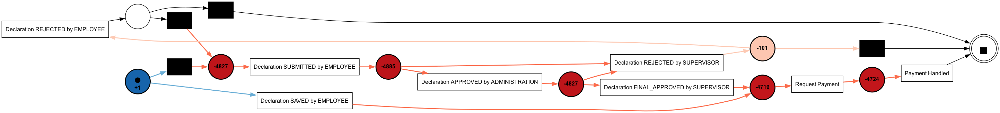

=== Cluster 1: 8523 events, 1116 cases ===


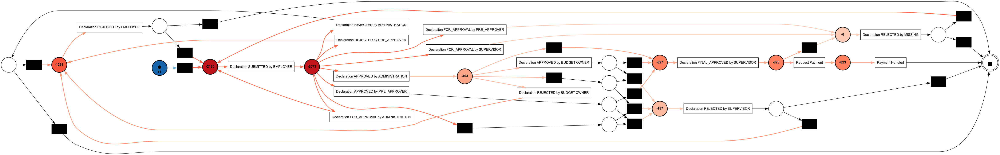

=== Cluster 2: 5950 events, 1459 cases ===


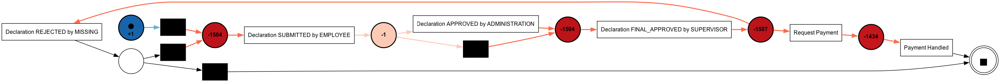

=== Cluster 3: 17848 events, 3064 cases ===


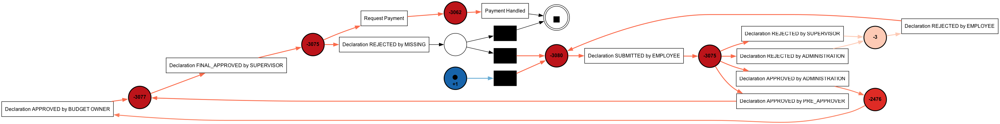

=== Cluster 4: 134 events, 134 cases ===


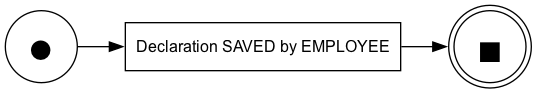

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.992058   1.000000        0.742356    0.724138     23982.0  0.914017
1        0.956301   0.785555        0.691010    0.595506      8523.0  0.830022
2        0.999706   0.891144        0.837507    0.818182      5950.0  0.877830
3        0.999791   0.876052        0.735817    0.750000     17848.0  0.872568
4        1.000000   1.000000        0.913613    1.000000       134.0  0.916003
=== Weighted Average Process Model Scores ===
fitness           0.989929
precision         0.916941
generalization    0.742972
simplicity        0.723461
custom            0.884414
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.7900063395500183
Custom Metric: 0.8820879178389983


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


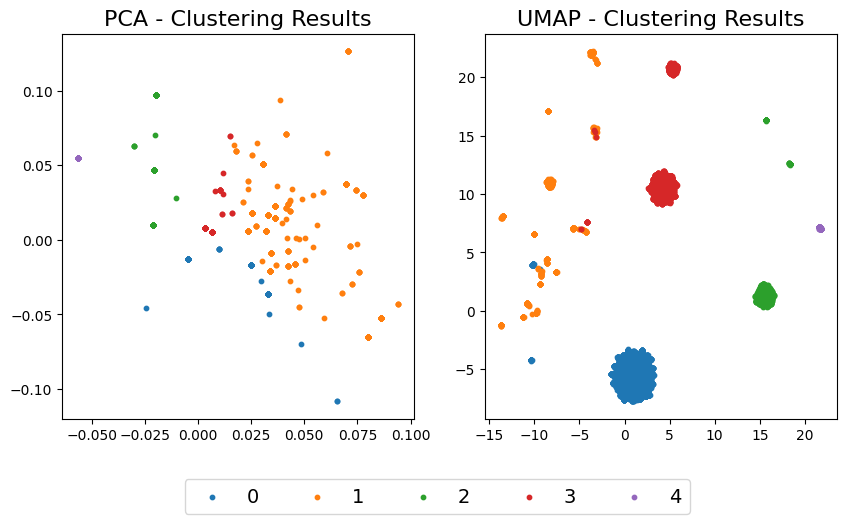

In [14]:
clusters_kmeans_node2vec_node = cluster_data_kmeans(node2vec_node_embeddings, n_clusters=5)
clustered_data_kmeans_node2vec_node = add_clusters_to_log(log, node2vec_node_embeddings, clusters_kmeans_node2vec_node)
clustered_logs_kmeans_node2vec_node = split_log_by_clusters(clustered_data_kmeans_node2vec_node)

mine_petri_nets(clustered_logs=clustered_logs_kmeans_node2vec_node, 
                encoding=node2vec_node_embeddings.iloc[:, 1:], 
                clusters=clusters_kmeans_node2vec_node,
                name="Node2Vec Node Embeddings + KMeans")
plot_dimension_reduction(node2vec_node_embeddings.iloc[:, 1:], clusters_kmeans_node2vec_node)

### Node2Vec Edge Embeddings

We map the resulting encodings based on the graph edges.

=== Cluster 0: 23114 events, 4624 cases ===


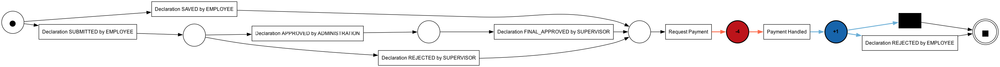

=== Cluster 1: 134 events, 134 cases ===


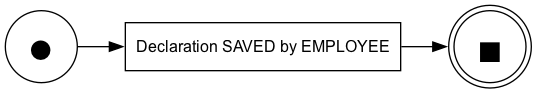

=== Cluster 2: 17895 events, 3070 cases ===


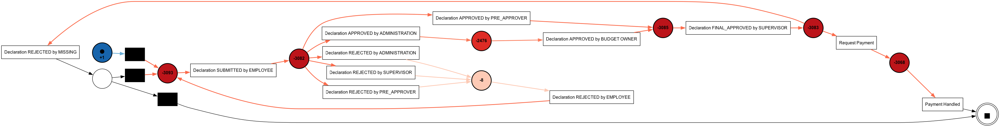

=== Cluster 3: 9352 events, 1214 cases ===


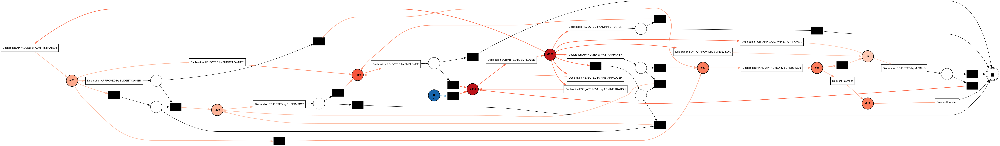

=== Cluster 4: 5942 events, 1458 cases ===


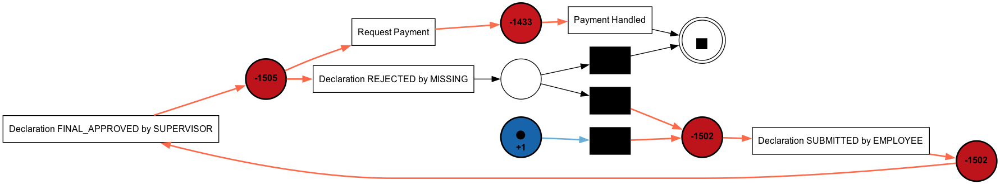

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.999876   1.000000        0.656861    0.800000     23114.0  0.926791
1        1.000000   1.000000        0.913613    1.000000       134.0  0.926821
2        0.999597   0.883480        0.740866    0.714286     17895.0  0.885938
3        0.941166   0.792256        0.692881    0.595506      9352.0  0.839403
4        0.999706   0.999832        0.924782    0.882353      5942.0  0.926689
=== Weighted Average Process Model Scores ===
fitness           0.990041
precision         0.928612
generalization    0.718284
simplicity        0.748081
custom            0.899346
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.8170535834073294
Custom Metric: 0.9011284434713067


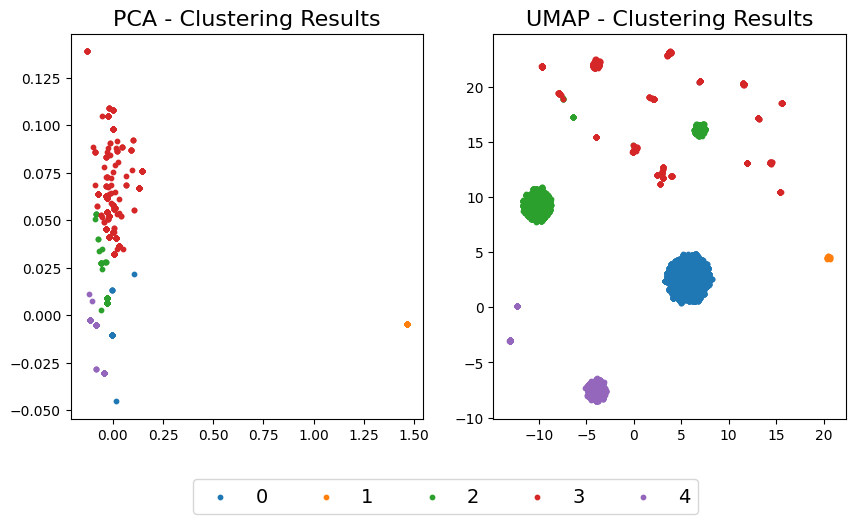

In [15]:
clusters_kmeans_node2vec_edge = cluster_data_kmeans(node2vec_edge_embeddings, n_clusters=5)
clustered_data_kmeans_node2vec_edge = add_clusters_to_log(log, node2vec_edge_embeddings, clusters_kmeans_node2vec_edge)
clustered_logs_kmeans_node2vec_edge = split_log_by_clusters(clustered_data_kmeans_node2vec_edge)

mine_petri_nets(clustered_logs=clustered_logs_kmeans_node2vec_edge, 
                encoding=node2vec_edge_embeddings.iloc[:, 1:], 
                clusters=clusters_kmeans_node2vec_edge,
                name="Node2Vec Edge Embeddings + KMeans")
plot_dimension_reduction(node2vec_edge_embeddings.iloc[:, 1:], clusters_kmeans_node2vec_edge)

### GraphWave Embeddings
_"Given an undirected graph 𝐺 = (𝑉 ,𝐸), an adjacency matrix 𝐴 (binary or weighted), and a diagonal matrix 𝐷𝑖𝑖 =vΣ 𝑗 𝐴𝑖𝑗 representing the degree of node 𝑖, this method learns a structural embedding of every vertex 𝑣 ∈ 𝑉 . The resulting GraphWave represents the compact node embeddings, where each row corresponds to a node in the graph and each column represents a dimension in the embedding space. These embeddings encode the structural similarities and local connectivity patterns of nodes."_

Based on the nature of the encoding approach only node mapping is applied.

=== Cluster 0: 28658 events, 6010 cases ===


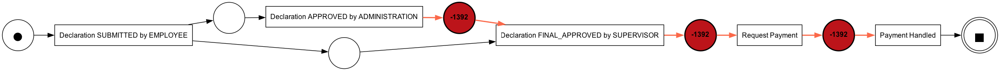

=== Cluster 1: 1233 events, 309 cases ===


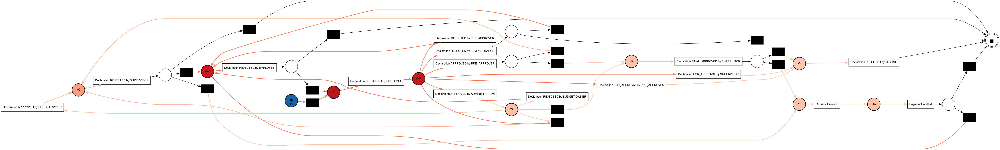

=== Cluster 2: 11253 events, 1526 cases ===


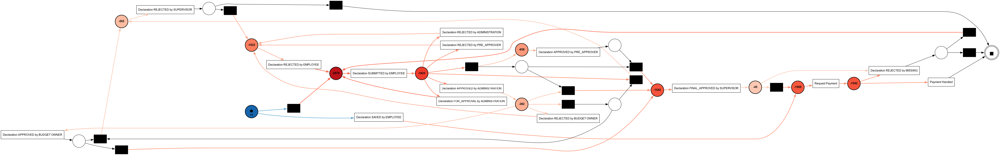

=== Cluster 3: 15159 events, 2521 cases ===


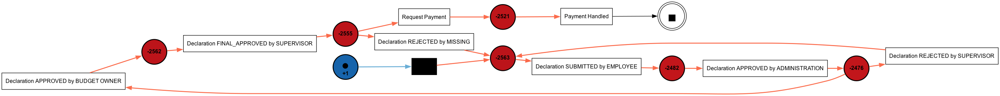

=== Cluster 4: 134 events, 134 cases ===


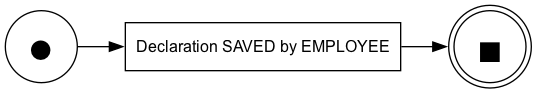

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.974265   1.000000        0.986738    1.000000     28658.0  0.921479
1        0.959806   0.921726        0.610692    0.615385      1233.0  0.890468
2        0.931560   0.898105        0.765542    0.589744     11253.0  0.875139
3        0.994582   0.923883        0.856041    0.894737     15159.0  0.899917
4        1.000000   1.000000        0.913613    1.000000       134.0  0.927913
=== Weighted Average Process Model Scores ===
fitness           0.970953
precision         0.957528
generalization    0.899139
simplicity        0.881522
custom            0.905786
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.8197817588518408
Custom Metric: 0.9029833921529826


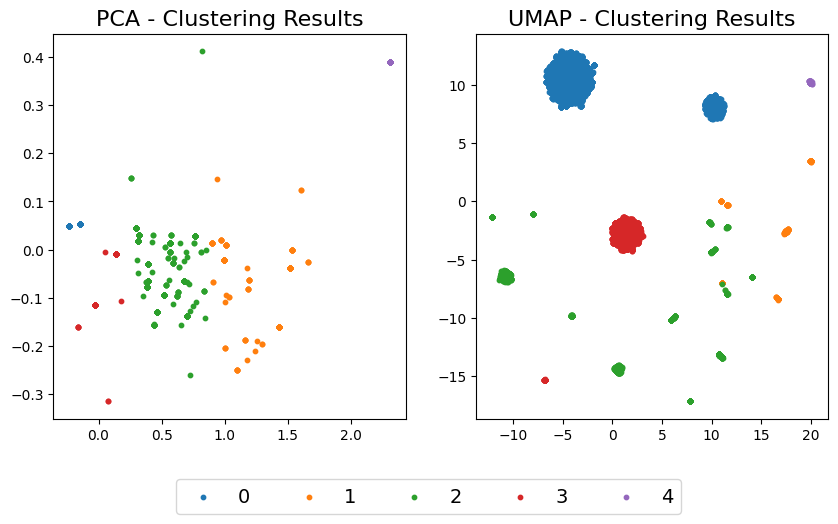

In [16]:
clusters_kmeans_graphWave = cluster_data_kmeans(graphWave_node_embeddings, n_clusters=5)
clustered_data_kmeans_graphWave = add_clusters_to_log(log, graphWave_node_embeddings, clusters_kmeans_graphWave)
clustered_logs_kmeans_graphWave = split_log_by_clusters(clustered_data_kmeans_graphWave)

mine_petri_nets(clustered_logs=clustered_logs_kmeans_graphWave, 
                encoding=graphWave_node_embeddings.iloc[:, 1:], 
                clusters=clusters_kmeans_graphWave,
                name="GraphWave Node Embeddings + KMeans")
plot_dimension_reduction(graphWave_node_embeddings.iloc[:, 1:], clusters_kmeans_graphWave)

### Walklets Node Embeddings

_"This algorithm combines factorization approaches with random walks to capture both local and global information. It preserves dependencies by sub-sampling short random walks on the vertices and by skipping over steps in each random walk. This results in paths of fixed lengths composing sets of pairs of vertices. Thus, these sets are used to learn the latent representations."_

We map the resulting encodings based on the graph nodes.

=== Cluster 0: 23098 events, 4619 cases ===


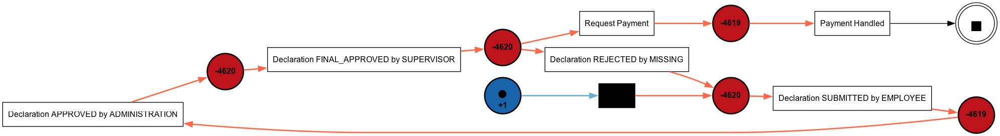

=== Cluster 1: 137 events, 135 cases ===


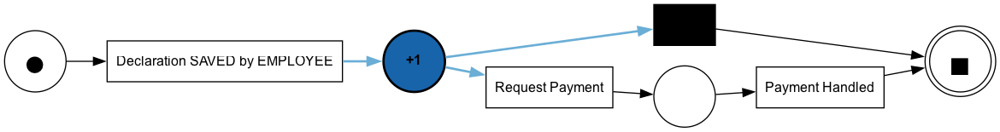

=== Cluster 2: 8803 events, 2018 cases ===


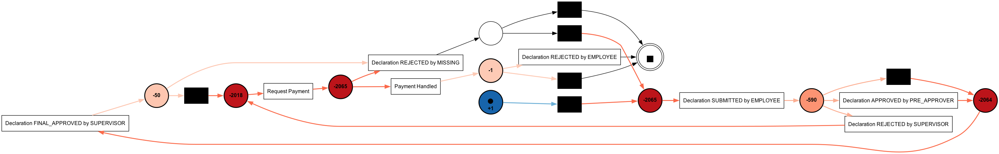

=== Cluster 3: 7932 events, 1082 cases ===


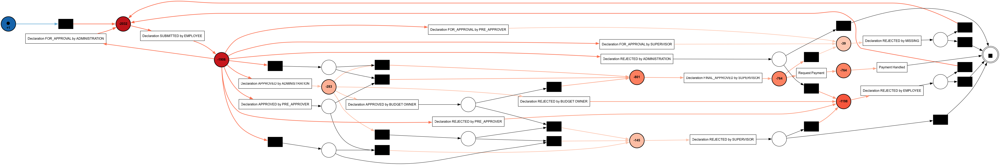

=== Cluster 4: 16467 events, 2646 cases ===


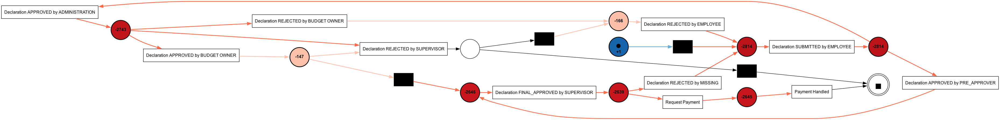

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.999983   0.900019        0.844531    1.000000     23098.0  0.893749
1        1.000000   1.000000        0.456887    1.000000       137.0  0.928746
2        0.993155   1.000000        0.779483    0.705882      8803.0  0.927035
3        0.885968   0.785125        0.704030    0.578947      7932.0  0.825032
4        0.989109   0.931705        0.758911    0.722222     16467.0  0.902120
=== Weighted Average Process Model Scores ===
fitness           0.979721
precision         0.908954
generalization    0.788715
simplicity        0.813897
custom            0.891810
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.8218650221824646
Custom Metric: 0.8953362718663564


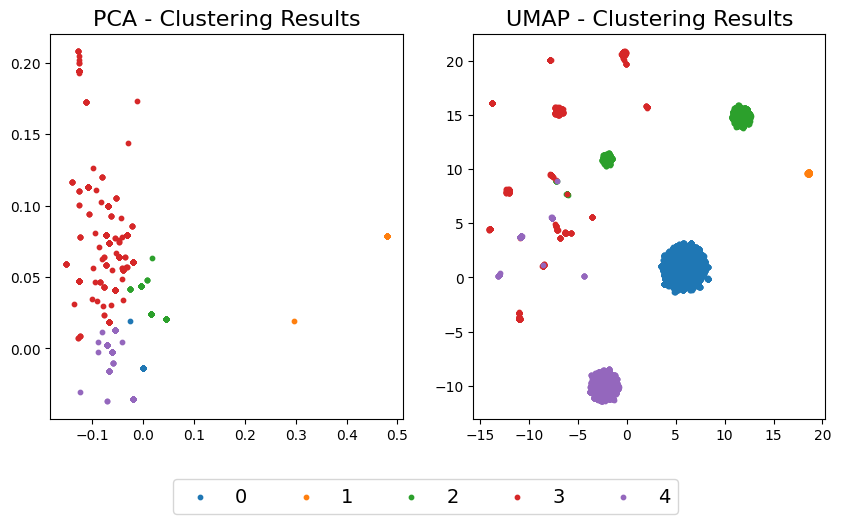

In [17]:
clusters_kmeans_walklets_node = cluster_data_kmeans(walklets_node_embeddings, n_clusters=5)
clustered_data_kmeans_walklets_node = add_clusters_to_log(log, walklets_node_embeddings, clusters_kmeans_walklets_node)
clustered_logs_kmeans_walklets_node = split_log_by_clusters(clustered_data_kmeans_walklets_node)

mine_petri_nets(clustered_logs=clustered_logs_kmeans_walklets_node, 
                encoding=walklets_node_embeddings.iloc[:, 1:], 
                clusters=clusters_kmeans_walklets_node,
                name="Walklets Node Embeddings + KMeans")
plot_dimension_reduction(walklets_node_embeddings.iloc[:, 1:], clusters_kmeans_walklets_node)

=== Cluster 0: 23791 events, 4696 cases ===


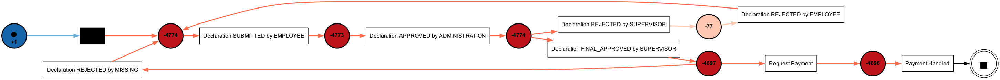

=== Cluster 1: 134 events, 134 cases ===


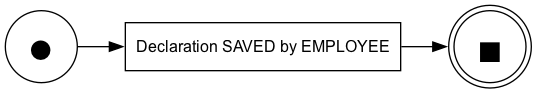

=== Cluster 2: 8806 events, 2019 cases ===


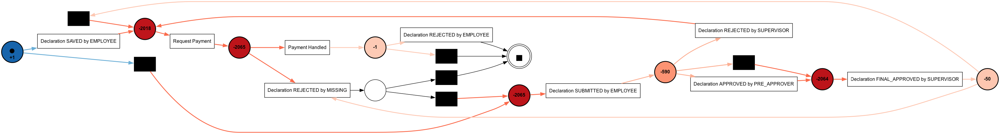

=== Cluster 3: 7940 events, 1079 cases ===


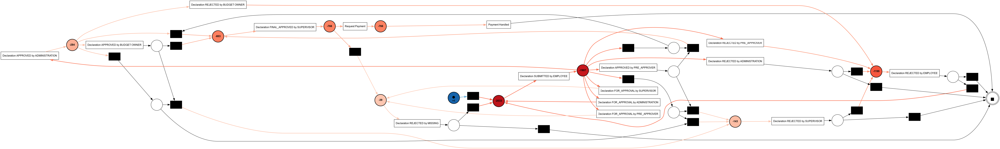

=== Cluster 4: 15766 events, 2572 cases ===


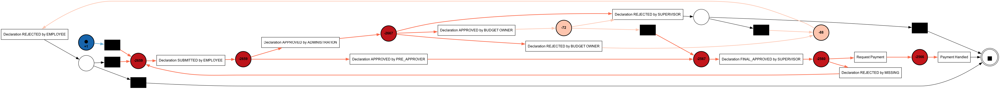

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.999984   0.908839        0.853862    0.894737     23791.0  0.897835
1        1.000000   1.000000        0.913613    1.000000       134.0  0.929745
2        0.992476   1.000000        0.727518    0.675676      8806.0  0.927865
3        0.887560   0.785144        0.692002    0.578947      7940.0  0.826436
4        0.994266   0.929827        0.765310    0.707317     15766.0  0.903751
=== Weighted Average Process Model Scores ===
fitness           0.981398
precision         0.911740
generalization    0.786781
simplicity        0.764022
custom            0.894204
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.824363710889475
Custom Metric: 0.8971265017297778


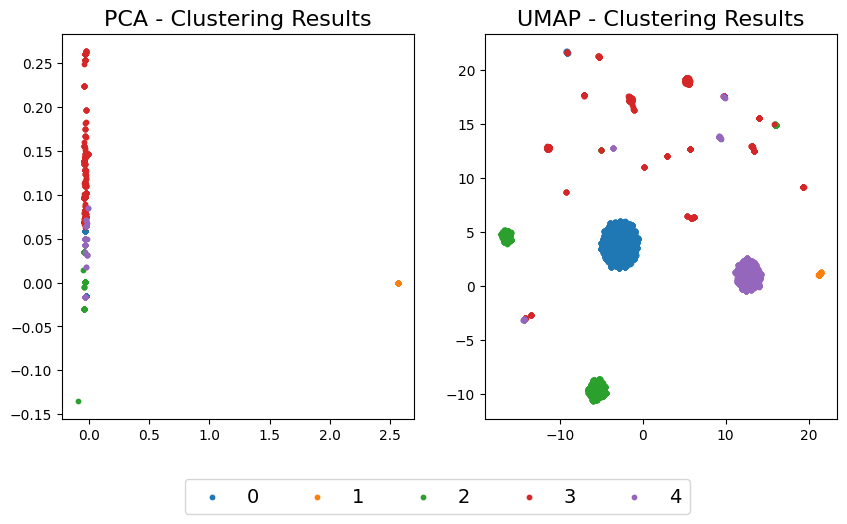

In [18]:
clusters_kmeans_walklets_edge = cluster_data_kmeans(walklets_edge_embeddings, n_clusters=5)
clustered_data_kmeans_walklets_edge = add_clusters_to_log(log, walklets_node_embeddings, clusters_kmeans_walklets_edge)
clustered_logs_kmeans_walklets_edge = split_log_by_clusters(clustered_data_kmeans_walklets_edge)

mine_petri_nets(clustered_logs=clustered_logs_kmeans_walklets_edge, 
                encoding=walklets_edge_embeddings.iloc[:, 1:], 
                clusters=clusters_kmeans_walklets_edge,
                name="Walklets Edge Embeddings + KMeans")
plot_dimension_reduction(walklets_edge_embeddings.iloc[:, 1:], clusters_kmeans_walklets_edge)

### Walklets Edge Embeddings

We map the resulting encodings based on the graph edges.

=== Cluster 0: 23791 events, 4696 cases ===


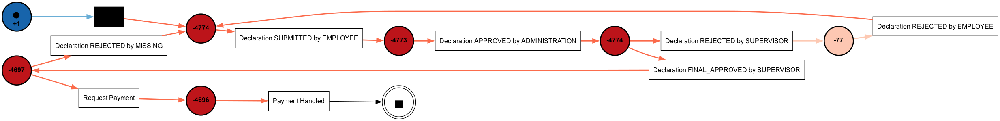

=== Cluster 1: 134 events, 134 cases ===


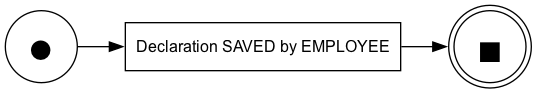

=== Cluster 2: 8806 events, 2019 cases ===


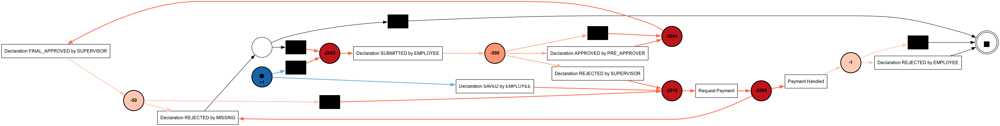

=== Cluster 3: 7940 events, 1079 cases ===


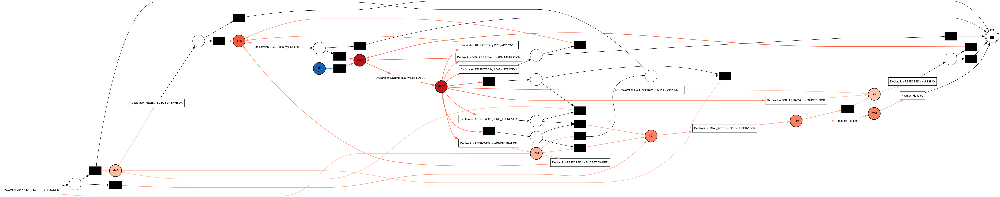

=== Cluster 4: 15766 events, 2572 cases ===


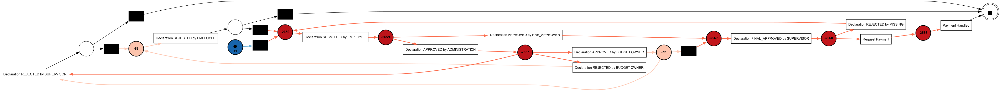

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.999984   0.908839        0.853862    0.894737     23791.0  0.897835
1        1.000000   1.000000        0.913613    1.000000       134.0  0.929745
2        0.992476   1.000000        0.727518    0.675676      8806.0  0.927865
3        0.887560   0.785144        0.692002    0.578947      7940.0  0.826436
4        0.994266   0.929827        0.765310    0.707317     15766.0  0.903751
=== Weighted Average Process Model Scores ===
fitness           0.981398
precision         0.911740
generalization    0.786781
simplicity        0.764022
custom            0.894204
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.824363710889475
Custom Metric: 0.8971265017297778


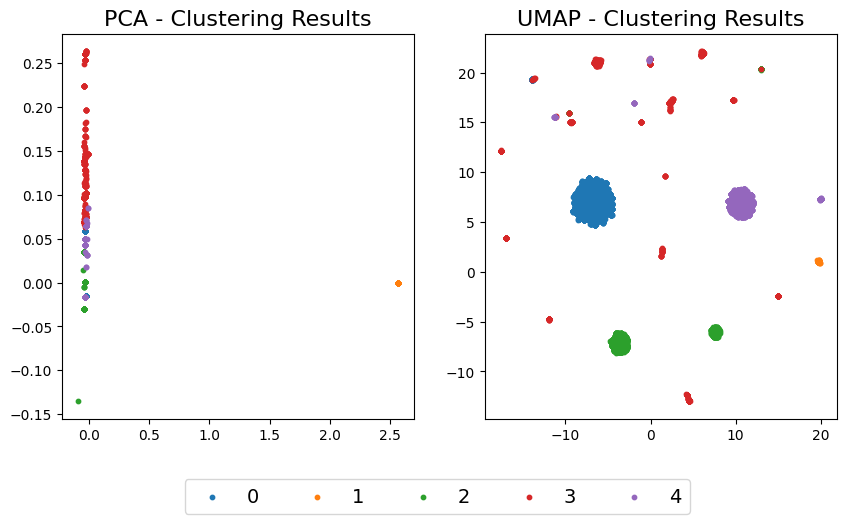

In [19]:
clusters_kmeans_walklets_edge = cluster_data_kmeans(walklets_edge_embeddings, n_clusters=5)
clustered_data_kmeans_walklets_edge = add_clusters_to_log(log, walklets_edge_embeddings, clusters_kmeans_walklets_edge)
clustered_logs_kmeans_walklets_edge = split_log_by_clusters(clustered_data_kmeans_walklets_edge)

mine_petri_nets(clustered_logs=clustered_logs_kmeans_walklets_edge, 
                encoding=walklets_edge_embeddings.iloc[:, 1:], 
                clusters=clusters_kmeans_walklets_edge,
                name="Walklets Edge Embeddings + KMeans")
plot_dimension_reduction(walklets_edge_embeddings.iloc[:, 1:], clusters_kmeans_walklets_edge)

## Clustering with Agglomerative Clustering
A hierarchical clustering approach seems to be a good fit for process mining. Let's see if it improves the results. 

_"Agglomerative clustering uses a bottom up approach. Each observation starts in its own cluster, and clusters are successively merged together. The linkage criteria determines the metric used for the merge strategy"_

We try to find 5 different clusters with each configuartion for comparison. 

### Node2Vec Node Embeddings

=== Cluster 0: 25383 events, 4900 cases ===


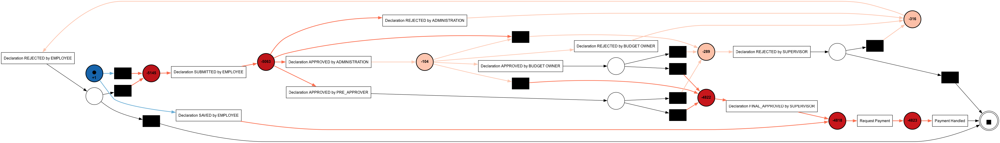

=== Cluster 1: 1666 events, 347 cases ===


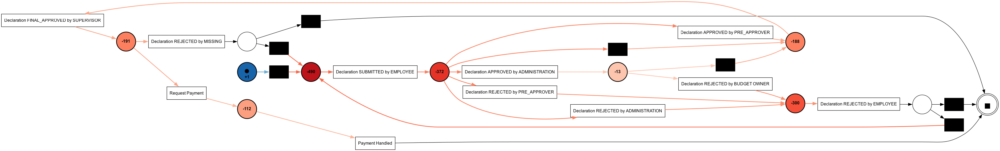

=== Cluster 2: 134 events, 134 cases ===


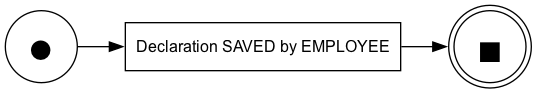

=== Cluster 3: 5568 events, 1392 cases ===


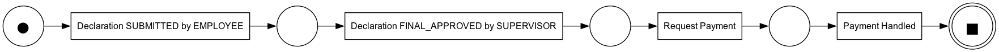

=== Cluster 4: 23686 events, 3727 cases ===


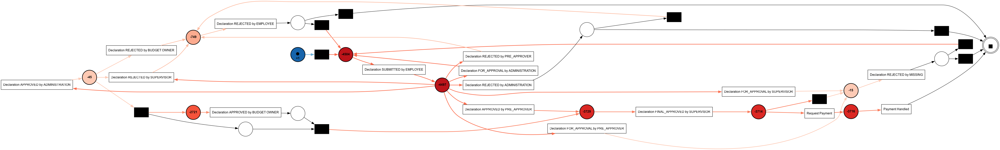

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.994353   0.944488        0.782841    0.649123     25383.0  0.879104
1        0.998237   0.931344        0.834782    0.674419      1666.0  0.875474
2        1.000000   1.000000        0.913613    1.000000       134.0  0.899945
3        1.000000   1.000000        0.973197    1.000000      5568.0  0.899945
4        0.988612   0.864718        0.709221    0.617647     23686.0  0.849749
=== Weighted Average Process Model Scores ===
fitness           0.992629
precision         0.916230
generalization    0.772568
simplicity        0.672110
custom            0.868782
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.7498620748519897
Custom Metric: 0.88084334748253


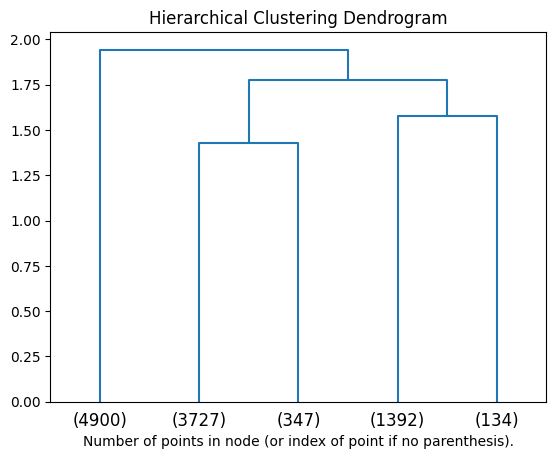

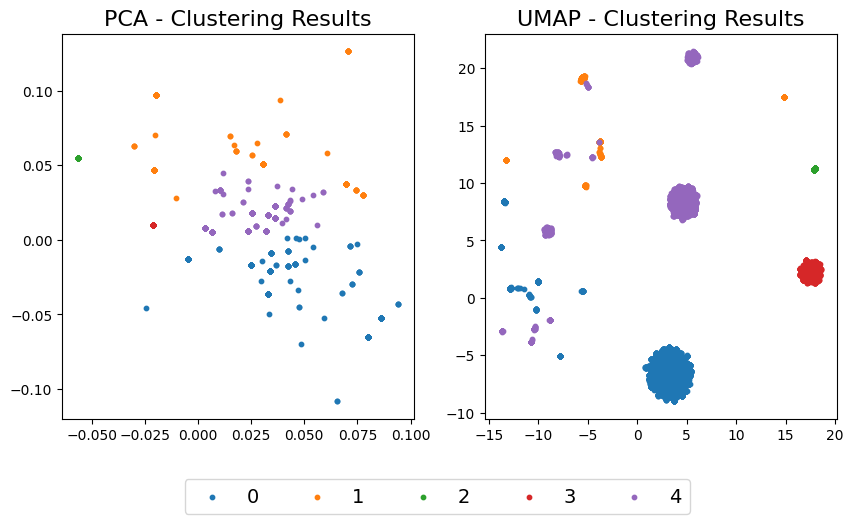

In [20]:
clusters_hierarchical_node2vec_node = cluster_data_hierarchical(node2vec_node_embeddings, n_clusters=5)
clustered_data_hierarchical_node2vec_node = add_clusters_to_log(log, node2vec_node_embeddings, clusters_hierarchical_node2vec_node)
clustered_logs_hierarchical_node2vec_node = split_log_by_clusters(clustered_data_hierarchical_node2vec_node)

mine_petri_nets(clustered_logs=clustered_logs_hierarchical_node2vec_node,
                encoding=node2vec_node_embeddings.iloc[:, 1:], 
                clusters=clusters_hierarchical_node2vec_node,
                name="Node2Vec Node Embeddings + Agglomerative Clustering")
plot_dendrogram(node2vec_node_embeddings.iloc[:, 1:])
plot_dimension_reduction(node2vec_node_embeddings.iloc[:, 1:], clusters_hierarchical_node2vec_node)

### Node2Vec Edge Embeddings

=== Cluster 0: 8823 events, 1146 cases ===


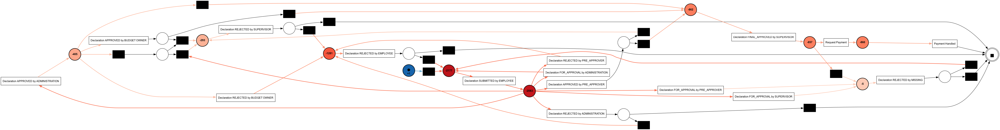

=== Cluster 1: 23109 events, 4623 cases ===


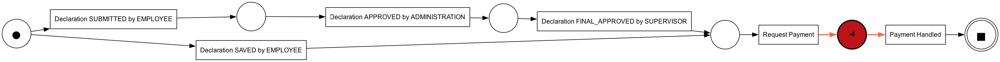

=== Cluster 2: 18803 events, 3205 cases ===


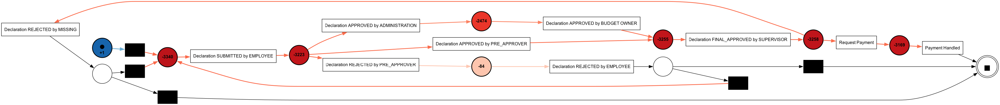

=== Cluster 3: 134 events, 134 cases ===


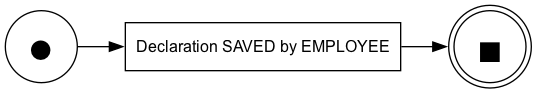

=== Cluster 4: 5568 events, 1392 cases ===


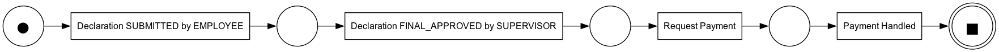

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.947289   0.790871        0.680945    0.600000      8823.0  0.833502
1        0.999876   1.000000        0.821075    1.000000     23109.0  0.919844
2        0.995767   0.941252        0.914558    0.764706     18803.0  0.898254
3        1.000000   1.000000        0.913613    1.000000       134.0  0.919875
4        1.000000   1.000000        0.973197    1.000000      5568.0  0.919875
=== Weighted Average Process Model Scores ===
fitness           0.990299
precision         0.947733
generalization    0.845542
simplicity        0.859074
custom            0.899156
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.7996864047105299
Custom Metric: 0.898269758810686


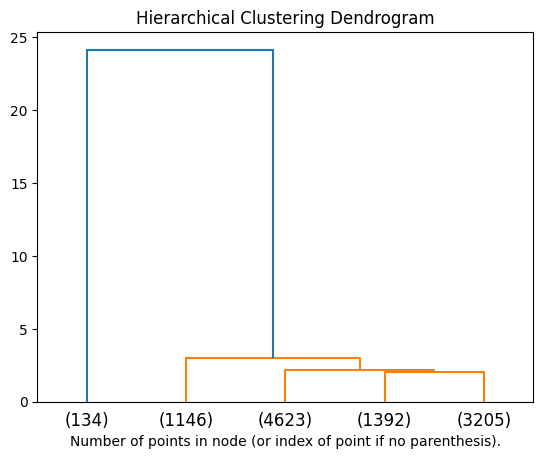

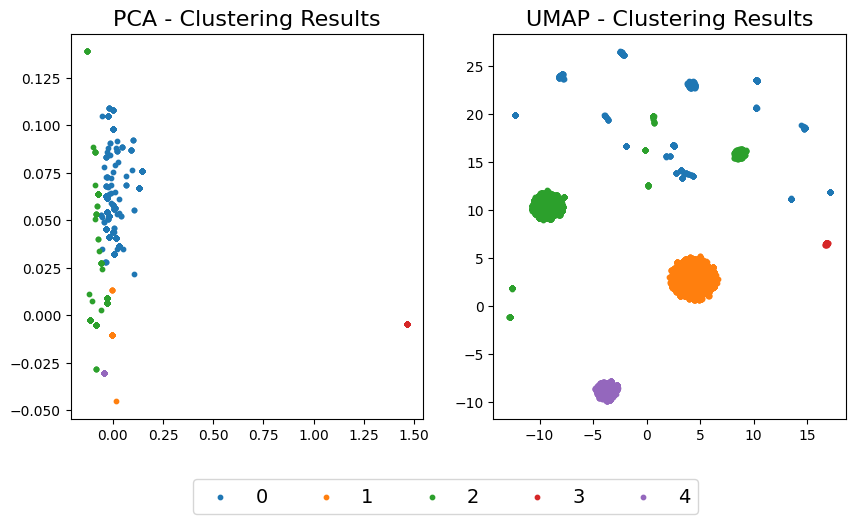

In [21]:
clusters_hierarchical_node2vec_edge = cluster_data_hierarchical(node2vec_edge_embeddings, n_clusters=5)
clustered_data_hierarchical_node2vec_edge = add_clusters_to_log(log, node2vec_edge_embeddings, clusters_hierarchical_node2vec_edge)
clustered_logs_hierarchical_node2vec_edge = split_log_by_clusters(clustered_data_hierarchical_node2vec_edge)

mine_petri_nets(clustered_logs=clustered_logs_hierarchical_node2vec_edge,
                encoding=node2vec_edge_embeddings.iloc[:, 1:], 
                clusters=clusters_hierarchical_node2vec_edge,
                name="Node2Vec Edge Embeddings + Agglomerative Clustering")
plot_dendrogram(node2vec_edge_embeddings.iloc[:, 1:])
plot_dimension_reduction(node2vec_edge_embeddings.iloc[:, 1:], clusters_hierarchical_node2vec_edge)

### Walklets Node Embeddings

=== Cluster 0: 37928 events, 7091 cases ===


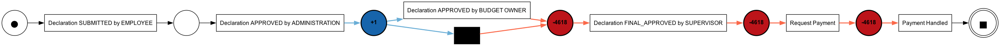

=== Cluster 1: 8443 events, 1967 cases ===


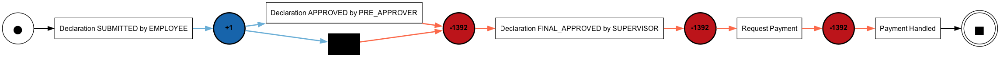

=== Cluster 2: 9270 events, 1104 cases ===


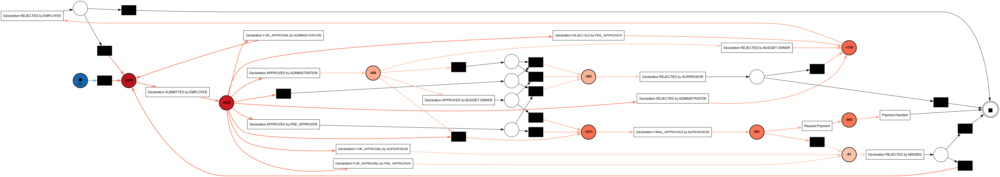

=== Cluster 3: 137 events, 135 cases ===


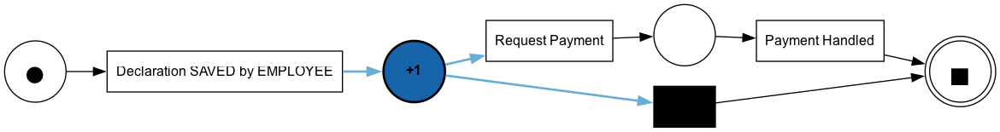

=== Cluster 4: 659 events, 203 cases ===


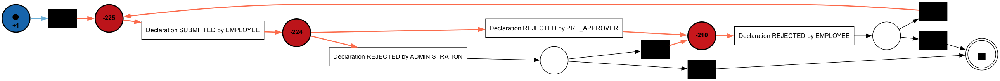

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        1.000000   1.000000        0.986543    1.000000     37928.0  0.876637
1        1.000000   1.000000        0.973551    1.000000      8443.0  0.876637
2        0.888320   0.796946        0.727536    0.581395      9270.0  0.777648
3        1.000000   1.000000        0.456887    1.000000       137.0  0.876637
4        0.995308   0.990847        0.845376    0.800000       659.0  0.872260
=== Weighted Average Process Model Scores ===
fitness           0.981601
precision         0.966541
generalization    0.939122
simplicity        0.928907
custom            0.860327
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.6915923357009888
Custom Metric: 0.8559638530510562


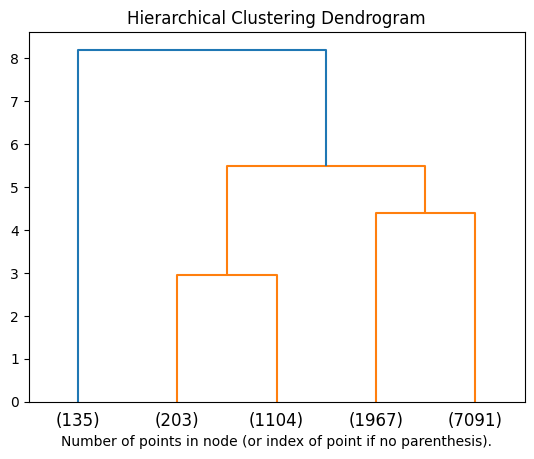

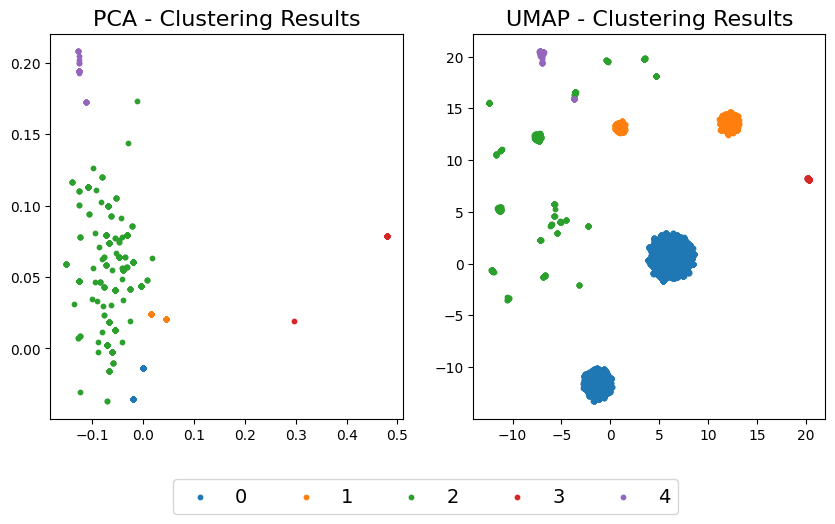

In [22]:
clusters_hierarchical_walklets_node = cluster_data_hierarchical(walklets_node_embeddings, n_clusters=5)
clustered_data_hierarchical_walklets_node = add_clusters_to_log(log, walklets_node_embeddings, clusters_hierarchical_walklets_node)
clustered_logs_hierarchical_walklets_node = split_log_by_clusters(clustered_data_hierarchical_walklets_node)

mine_petri_nets(clustered_logs=clustered_logs_hierarchical_walklets_node,
                encoding=walklets_node_embeddings.iloc[:, 1:], 
                clusters=clusters_hierarchical_walklets_node,
                name="Walklets Node Embeddings + Agglomerative Clustering")
plot_dendrogram(walklets_node_embeddings.iloc[:, 1:])
plot_dimension_reduction(walklets_node_embeddings.iloc[:, 1:], clusters_hierarchical_walklets_node)

### Walklets Edge Embeddings

=== Cluster 0: 37928 events, 7091 cases ===


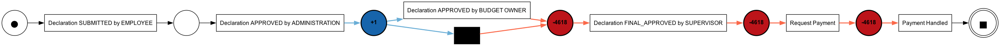

=== Cluster 1: 8451 events, 1969 cases ===


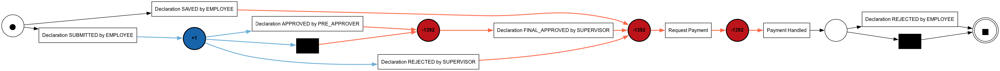

=== Cluster 2: 9265 events, 1103 cases ===


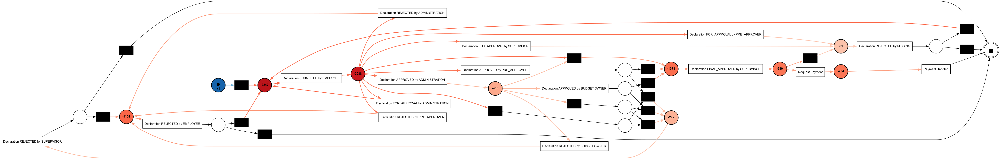

=== Cluster 3: 134 events, 134 cases ===


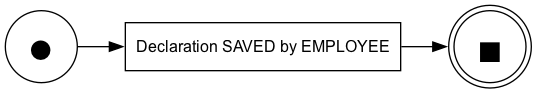

=== Cluster 4: 659 events, 203 cases ===


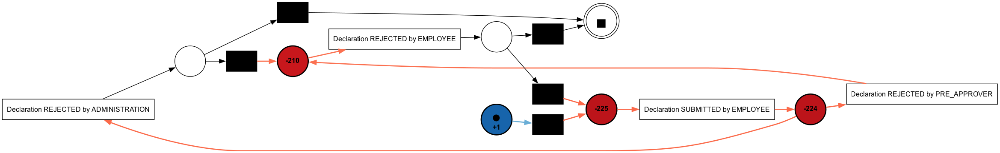

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        1.000000   1.000000        0.986543    1.000000     37928.0  0.883512
1        1.000000   1.000000        0.681879    0.739130      8451.0  0.883512
2        0.888672   0.796894        0.727494    0.581395      9265.0  0.784593
3        1.000000   1.000000        0.913613    1.000000       134.0  0.883512
4        0.995308   0.990847        0.845376    0.800000       659.0  0.879135
=== Weighted Average Process Model Scores ===
fitness           0.981669
precision         0.966550
generalization    0.896573
simplicity        0.889881
custom            0.867222
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.7087793857288329
Custom Metric: 0.8628526525188001


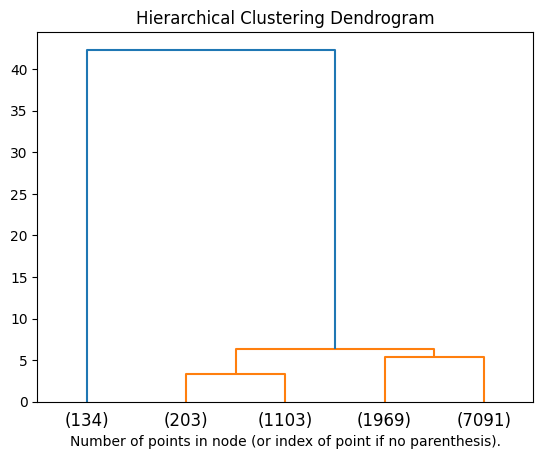

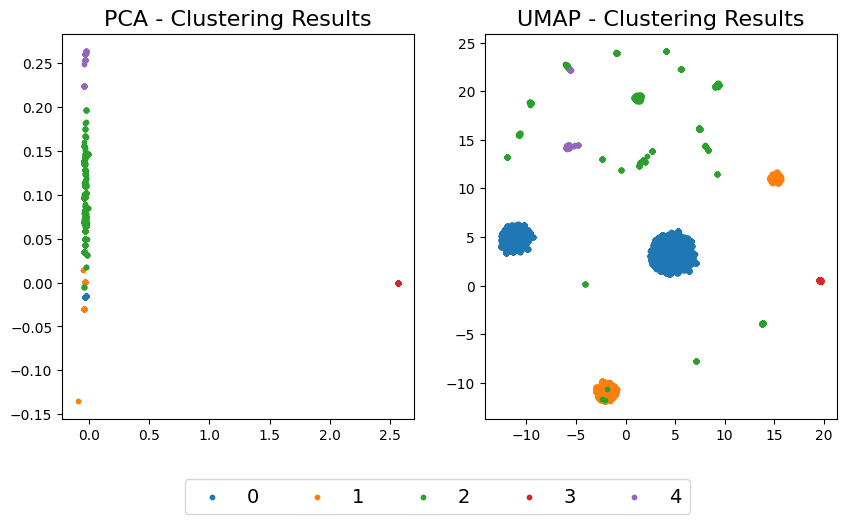

In [23]:
clusters_hierarchical_walklets_edge = cluster_data_hierarchical(walklets_edge_embeddings, n_clusters=5)
clustered_data_hierarchical_walklets_edge = add_clusters_to_log(log, walklets_edge_embeddings, clusters_hierarchical_walklets_edge)
clustered_logs_hierarchical_walklets_edge = split_log_by_clusters(clustered_data_hierarchical_walklets_edge)

mine_petri_nets(clustered_logs=clustered_logs_hierarchical_walklets_edge,
                encoding=walklets_edge_embeddings.iloc[:, 1:], 
                clusters=clusters_hierarchical_walklets_edge,
                name="Walklets Edge Embeddings + Agglomerative Clustering")
plot_dendrogram(walklets_edge_embeddings.iloc[:, 1:])
plot_dimension_reduction(walklets_edge_embeddings.iloc[:, 1:], clusters_hierarchical_walklets_edge)

### GraphWave Embeddings

=== Cluster 0: 11766 events, 1613 cases ===


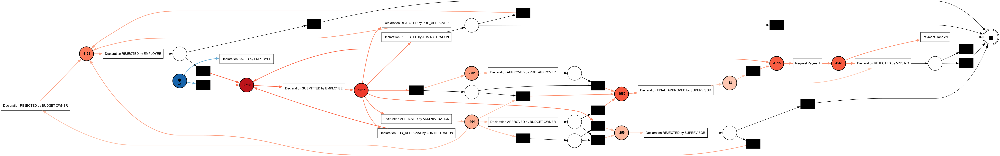

=== Cluster 1: 28658 events, 6010 cases ===


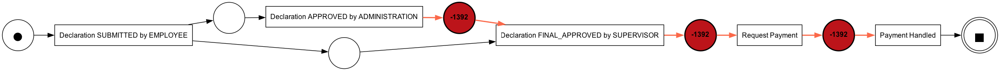

=== Cluster 2: 720 events, 222 cases ===


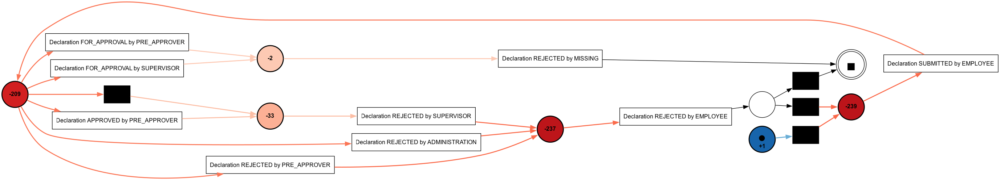

=== Cluster 3: 15159 events, 2521 cases ===


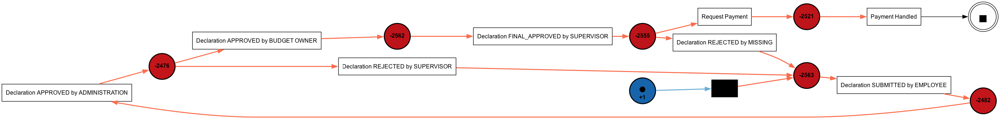

=== Cluster 4: 134 events, 134 cases ===


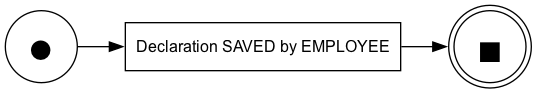

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.918739   0.900107        0.783069    0.590909     11766.0  0.867909
1        0.974265   1.000000        0.986738    1.000000     28658.0  0.916753
2        1.000000   0.964774        0.648246    0.677419       720.0  0.910858
3        0.994582   0.923883        0.856041    0.894737     15159.0  0.895191
4        1.000000   1.000000        0.913613    1.000000       134.0  0.923187
=== Weighted Average Process Model Scores ===
fitness           0.968536
precision         0.958280
generalization    0.904679
simplicity        0.882324
custom            0.900719
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.8079670212997558
Custom Metric: 0.902779667157969


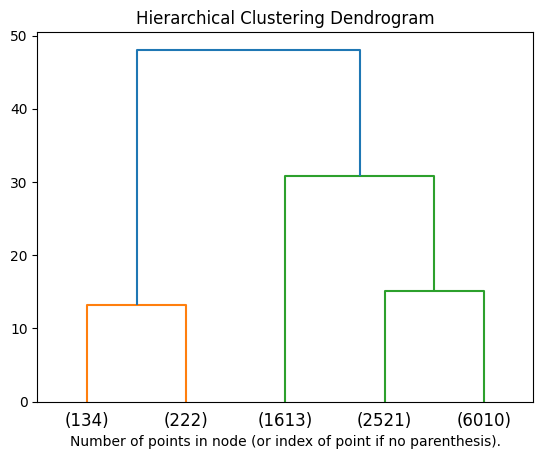

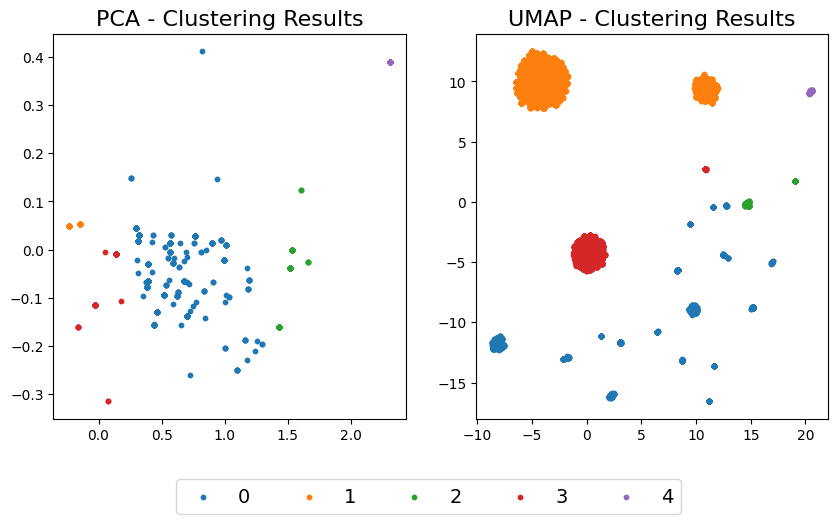

In [24]:
clusters_hierarchical_graphWave = cluster_data_hierarchical(graphWave_node_embeddings, n_clusters=5)
clustered_data_hierarchical_graphWave = add_clusters_to_log(log, graphWave_node_embeddings, clusters_hierarchical_graphWave)
clustered_logs_hierarchical_graphWave = split_log_by_clusters(clustered_data_hierarchical_graphWave)

mine_petri_nets(clustered_logs=clustered_logs_hierarchical_graphWave, 
                encoding=graphWave_node_embeddings.iloc[:, 1:], 
                clusters=clusters_hierarchical_graphWave,
                name="GraphWave Embeddings + Agglomerative Clustering")
plot_dendrogram(graphWave_node_embeddings.iloc[:, 1:])
plot_dimension_reduction(graphWave_node_embeddings.iloc[:, 1:], clusters_hierarchical_graphWave)

## Clustering with Self-Organizing Maps (SOM) 
After traditional approaches did not differ that much, maybe a neural network is the answer! (it always is, right?)

_"SOM is a type of Artificial Neural Network able to convert complex, nonlinear statistical relationships between high-dimensional data items into simple geometric relationships on a low-dimensional display."_

We try to find 5 different clusters. Just the most promising embedding so far is tested (GraphWave). 

### GraphWave Embeddings

=== Cluster 0: 28658 events, 6010 cases ===


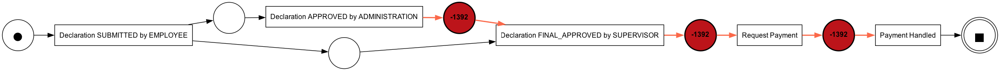

=== Cluster 1: 15159 events, 2521 cases ===


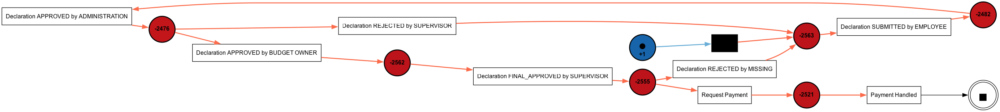

=== Cluster 2: 11253 events, 1526 cases ===


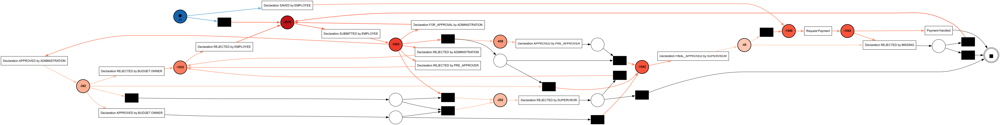

=== Cluster 3: 1233 events, 309 cases ===


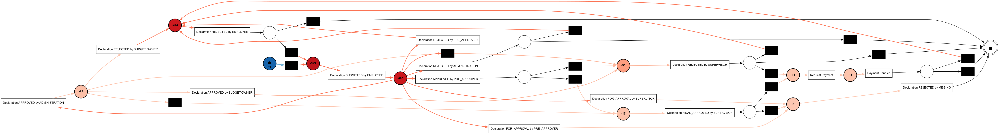

=== Cluster 4: 134 events, 134 cases ===


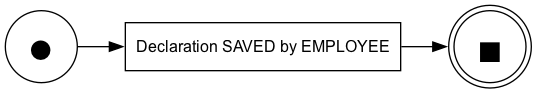

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.974265   1.000000        0.986738    1.000000     28658.0  0.921479
1        0.994582   0.923883        0.856041    0.894737     15159.0  0.899917
2        0.931560   0.898105        0.765542    0.589744     11253.0  0.875139
3        0.959806   0.921726        0.610692    0.615385      1233.0  0.890468
4        1.000000   1.000000        0.913613    1.000000       134.0  0.927913
=== Weighted Average Process Model Scores ===
fitness           0.970953
precision         0.957528
generalization    0.899139
simplicity        0.881522
custom            0.905786
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.8197817588518408
Custom Metric: 0.9029833921529825


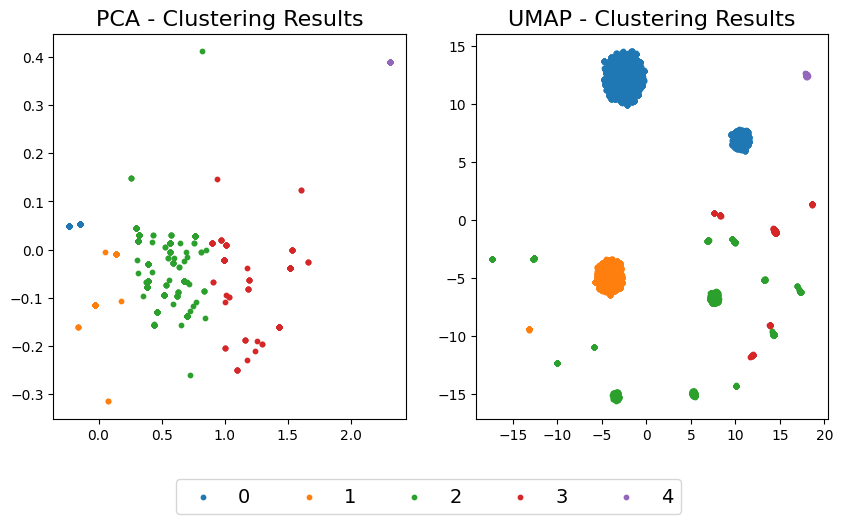

In [25]:
clusters_som_graphWave = cluster_data_som(graphWave_node_embeddings, n_clusters=5)
clustered_data_som_graphWave = add_clusters_to_log(log, graphWave_node_embeddings, clusters_som_graphWave)
clustered_logs_som_graphWave = split_log_by_clusters(clustered_data_som_graphWave)

mine_petri_nets(clustered_logs=clustered_logs_som_graphWave, 
                encoding=graphWave_node_embeddings.iloc[:, 1:], 
                clusters=clusters_som_graphWave,
                name="GraphWave Embeddings + SOM Clustering")
plot_dimension_reduction(graphWave_node_embeddings.iloc[:, 1:], clusters_som_graphWave)

## Clustering with Deep Embedded Clustering (DEC)
After a neural network was not the answer, maybe we need to dig deeper! (as in deep learning - get it?)

We try to find 5 different clusters. Just the most promising embedding so far (GraphWave) is tested, which has also the largest default dimensionality, potentially more suitable for this algorithm.

### GraphWave Embeddings

=== Cluster 0: 12620 events, 1969 cases ===


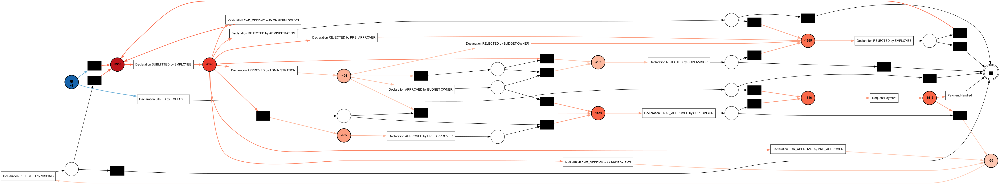

=== Cluster 1: 23090 events, 4618 cases ===


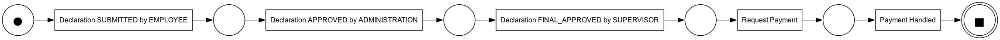

=== Cluster 2: 20424 events, 3868 cases ===


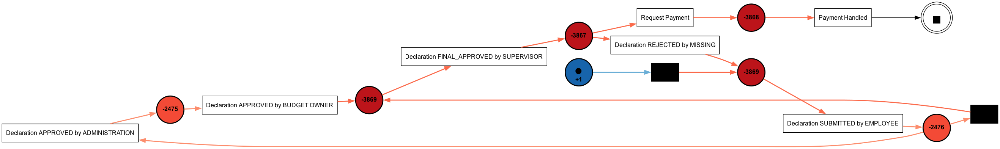

=== Cluster 3: 287 events, 41 cases ===


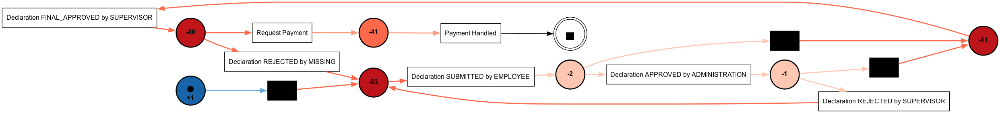

=== Cluster 4: 16 events, 4 cases ===


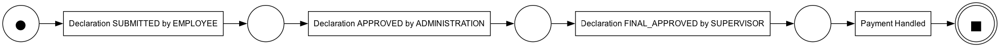

=== Process Model Scores ===
          fitness  precision  generalization  simplicity  log_length    custom
Cluster                                                                       
0        0.921251   0.878443        0.729504    0.584158     12620.0  0.755515
1        1.000000   1.000000        0.985285    1.000000     23090.0  0.817748
2        0.999921   0.944605        0.872513    0.894737     20424.0  0.798339
3        0.997783   0.820917        0.633097    0.818182       287.0  0.754514
4        1.000000   1.000000        0.500000    1.000000        16.0  0.817748
=== Weighted Average Process Model Scores ===
fitness           0.982351
precision         0.951861
generalization    0.885349
simplicity        0.867994
custom            0.796486
dtype: float64
=== Clustering Scores ===
Silhouette Score: 0.5443688325596822
Custom Metric: 0.7887727540214962


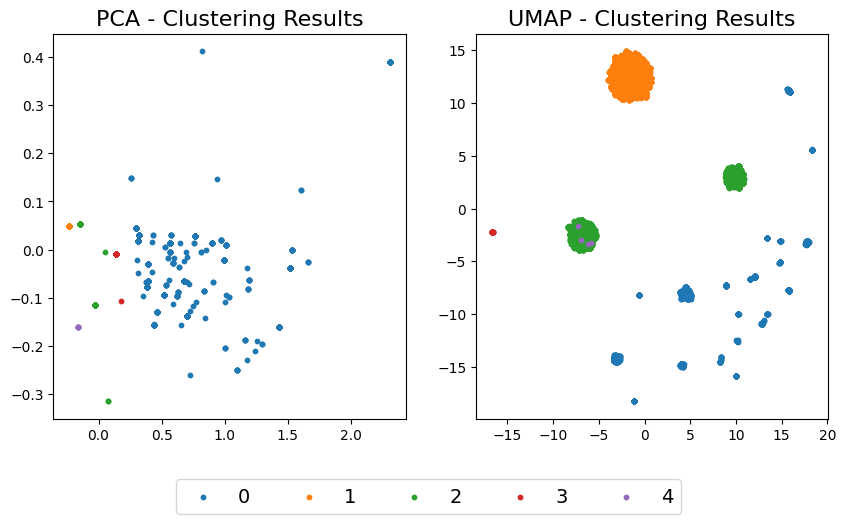

In [26]:
clusters_dec_graphWave = cluster_data_dec(graphWave_node_embeddings, n_clusters=5)
clustered_data_dec_graphWave = add_clusters_to_log(log, graphWave_node_embeddings, clusters_dec_graphWave)
clustered_logs_dec_graphWave = split_log_by_clusters(clustered_data_dec_graphWave)

mine_petri_nets(clustered_logs=clustered_logs_dec_graphWave, 
                encoding=graphWave_node_embeddings.iloc[:, 1:], 
                clusters=clusters_dec_graphWave,
                name="GraphWave Embeddings + DEC Clustering")
plot_dimension_reduction(graphWave_node_embeddings.iloc[:, 1:], clusters_dec_graphWave)

## Evaluation of Process Models

The custom metric is a weighted combination of fitness, precision, and silhouette score.

In [27]:
experiment_results_df = pd.DataFrame(experiment_results).T
experiment_results_df

,fitness,precision,generalization,simplicity,custom
Node2Vec Node Embeddings + KMeans,0.989929,0.916941,0.742972,0.723461,0.884414
Node2Vec Edge Embeddings + KMeans,0.990041,0.928612,0.718284,0.748081,0.899346
GraphWave Node Embeddings + KMeans,0.970953,0.957528,0.899139,0.881522,0.905786
Walklets Node Embeddings + KMeans,0.979721,0.908954,0.788715,0.813897,0.891810
Walklets Edge Embeddings + KMeans,0.981398,0.911740,0.786781,0.764022,0.894204
Node2Vec Node Embeddings + Agglomerative Clustering,0.992629,0.916230,0.772568,0.672110,0.868782
Node2Vec Edge Embeddings + Agglomerative Clustering,0.990299,0.947733,0.845542,0.859074,0.899156
Walklets Node Embeddings + Agglomerative Clustering,0.981601,0.966541,0.939122,0.928907,0.860327
Walklets Edge Embeddings + Agglomerative Clustering,0.981669,0.966550,0.896573,0.889881,0.867222
GraphWave Embeddings + Agglomerative Clustering,0.968536,0.958280,0.904679,0.882324,0.900719


### Implications and Learnings
**The exploration underscores the iterative nature of finding the optimal trace clustering approach. It involves experimenting with different combinations of embeddings, clustering algorithms, and parameters, followed by evaluating their effectiveness both quantitatively and qualitatively.**
- Evaluating the quality of process models derived from advanced clustering techniques is challenging. Traditional metrics like silhouette score or custom metrics provide some insights, but they may not fully capture the practical utility of the clustered process models in understanding or improving the underlying process. Manual inspection and domain knowledge are essential.
- Advanced approaches introduce complexity in terms of implementation and computation cost. The trade-off between gaining deeper insights and the overhead of complexity needs to be considered.
- Different embeddings (node, edge) reveal varied aspects of the process, suggesting that the choice of encoding can influence the clustering outcome. However, no major differences in the results for the selected graph-based encoding approaches could be observed. (Slight superiority of GraphWave embeddings needs to be considered in the light of way bigger dimensionality in the default configuration).
- The exploration shows that no single clustering algorithm outperforms others across all scenarios. Hierarchical clustering does however provide a more intuitive representation of the clustering structure. Neural network-based clustering (SOM, DEC) shows promise but does not necessarily lead to superior results compared to more traditional methods and may require more tuning and resources.
- The results suggest that the choice of encoding and clustering algorithm may not be as critical as the choice of the right features for the process mining task.

**Next:** Combine more preprocessing of the log with the most promising approach to potentially further optimize the clustering results and process models. We chose Walklets embeddings + Hierarchical Clustering for further tuning because of the interpretability of the results as well as potential for improvement and resource efficiency. 
> **Disclaimer:** The choice was made based on initial results from slightly different processing of the embeddings and before introduction of the custom metric, therefore GraphWave embeddings + Hierarchical Clustering might actually be the more attractive choice for further investigation.
